# Assignment 2: Data Analysis of EU procurement networks

Author: Kai Foerster <br>
ID: 214288 <br>
Date: 8 November 2023

## Todos

- read paper - done
- add two more small countries - done
- play around with the order of graphs according to lecture notes
- add time dimension - done
- no connection with the real world in the decription of the graphs
- create projection for hierarchy, clustering and most summary statistics - done
- fit a power law


## Questions
In the context of working with a bipartite graphs, 
- why do we not have in-degrees?
- does it make sense to represent data in tree layout?
- should I try to visualize in two layers or sets, where one set of nodes is placed on one side and the other set on the opposite side, highlighting the cross-links between them

## Importing and manipulating the data for further analysis
Note on running this .ipynb file: This file is running using graph-tool installed on the wsl:Ubuntu (Linux for Windows). Before running this file you will need to install graph-tool to your PC (different methods for Windows and Mac) or configure graph-tool on Google Colab. Below you find commented out, code to configure graph-tool in Google Colab. Instructions on how to install graph-tool on Windows or Mac can be found on the graph-tool website: https://graph-tool.skewed.de/static/doc/index.html#installing-graph-tool (Last accessed: 8 November 2023)

In [ ]:
#!echo "deb http://downloads.skewed.de/apt jammy main" >> /etc/apt/sources.list
#!apt-key adv --keyserver keyserver.ubuntu.com --recv-key 612DEFB798507F25
#!apt-get update
#!apt-get install python3-graph-tool python3-matplotlib python3-cairo

In [ ]:
#!apt purge python3-cairo
#!apt install libcairo2-dev pkg-config python3-dev
#!pip install --force-reinstall pycairo
#!pip install zstandard

In [10]:
# Import graph tool libraries
import graph_tool.all as gt
from graph_tool.all import Graph

In [2]:
# Import other libraries
import matplotlib.pyplot as plt
import numpy as np
import matplotlib
import os
import matplotlib.image as mpimg
import geopandas as gpd
import matplotlib.cm as cm
import matplotlib.colors as colors  
import networkx as nx
from networkx.algorithms import bipartite

In [3]:
# Import data on eu procurement contracts from Netzschleuder using graph tool and save the networks in the dictionary datasets

# Select the countries and years you want to retrieve
countries_years = [
    ('AT', '2008'),
    ('BG', '2008'),
    ('CY', '2008'),
    ('DK', '2008'),
    ('AT', '2016'),
    ('BG', '2016'),
    ('CY', '2016'),
    ('DK', '2016')
]

# Create a dictionary to hold your data
datasets = {}

# Iterate over each country/year pair and retrieve the corresponding dataset
for country_code, year in countries_years:
    dataset_name = f"{country_code}_{year}"  # This will be the key, e.g., 'AT_2016'
    full_dataset_name = f"eu_procurements_alt/{dataset_name}"  # This is the full path used to retrieve the dataset from Netzschleuder
    datasets[dataset_name] = gt.collection.ns[full_dataset_name]

# Now we have a dictionary where the keys are 'AT_2016', 'CY_2008', etc., and the values are the data you've retrieved

In [4]:
# Convert the graph-tool networks stored in datasets to networkx networks stored in datasets_nx
# Note: Given that graph-tool and networkx are different libraries, we need to convert the graph-tool networks to networkx networks
#       in order to use networkx functions. We need the networkx function bipartite.projected_graph() to compute the issuer and winner
#       projections. We also need the networkx function bipartite.is_bipartite() to check whether a graph is bipartite. Doing this
#       conversion is a bit cumbersome, but it's the only way to use networkx functions on graph-tool graphs. The equivalent functions
#       in graph-tool do not exist or must be implemented manually.

# Initialize the new dictionary to hold networkx datasets, saved in datasets_nx
datasets_nx = {}

for dataset_name, g_tool_graph in datasets.items():
    # Initialize a new networkx graph for the current dataset
    G_nx = nx.Graph()

    # Add vertices and their attributes to the networkx graph
    for v in g_tool_graph.vertices():
        # Here, 'v_prop' is a dictionary of the vertex properties
        v_prop = {prop: g_tool_graph.vp[prop][v] for prop in g_tool_graph.vertex_properties.keys()}
        G_nx.add_node(v, **v_prop)

    # Add edges and their attributes to the networkx graph
    for e in g_tool_graph.edges():
        # Here, 'e_prop' is a dictionary of the edge properties
        e_prop = {prop: g_tool_graph.ep[prop][e] for prop in g_tool_graph.edge_properties.keys()}
        G_nx.add_edge(e.source(), e.target(), **e_prop)

    # Add the networkx graph to the new datasets dictionary
    datasets_nx[dataset_name] = G_nx

# Now `datasets_nx` contains all the networkx graphs corresponding to the graph-tool graphs

In [5]:
# Create the issuer and winner projections using networkx functions. Then convert to projections in networkx format
# back to graph-tool format and save the networks in the dictionary datasets_prj. In the dictionary datasets_prj, 
# the keys are the names of the projections and the values are the projections themselves. The keys are named after
# country name, year, and projection type (issuer or winner). For example, the key 'AT_2016_issuer' corresponds to
# the issuer projection of the network for Austria in 2016.


datasets_prj = {}  # This dictionary will store the projections

# Function to create and return both issuer and winner projections from the eu procurement bipartite graphs
def create_projections(G):
    issuers_set = {n for n, d in G.nodes(data=True) if d['label'].endswith('_i')}
    winners_set = {n for n, d in G.nodes(data=True) if d['label'].endswith('_w')}

    # Create the bipartite projections
    issuer_projection = bipartite.projected_graph(G, issuers_set)
    winner_projection = bipartite.projected_graph(G, winners_set)

    return issuer_projection, winner_projection

# Function to convert a networkx graph to a graph-tool graph
def convert_networkx_to_graphtool(G_nx, name_description):
    G_gt = Graph(directed=False)
    pos_property = G_gt.new_vertex_property("vector<double>")
    label_property = G_gt.new_vertex_property("string")
    vertex_map = {node: G_gt.add_vertex() for node in G_nx}
    for node, data in G_nx.nodes(data=True):
        v = vertex_map[node]
        pos_property[v] = data.get('_pos', [0.0, 0.0])
        label_property[v] = data['label']
    for u, v in G_nx.edges():
        G_gt.add_edge(vertex_map[u], vertex_map[v])

    # Set the graph name and description properties
    G_gt.graph_properties["name"] = G_gt.new_graph_property("string", name_description[0])
    G_gt.graph_properties["description"] = G_gt.new_graph_property("string", name_description[1])

    return G_gt, pos_property, label_property

# Loop over each network in datasets_nx
for dataset_key, G_nx in datasets_nx.items():
    # Split the key to get country and year
    country, year = dataset_key.split('_')

    # Create the projections
    issuer_projection, winner_projection = create_projections(G_nx)

    # Convert projections to graph-tool format
    name_description = (f"eu_procurements_alt ({country}_{year}_issuer)",
                        "Issuer projection of the bipartite graph")
    datasets_prj[f"{country}_{year}_issuer"], _, _ = convert_networkx_to_graphtool(issuer_projection, name_description)

    name_description = (f"eu_procurements_alt ({country}_{year}_winner)",
                        "Winner projection of the bipartite graph")
    datasets_prj[f"{country}_{year}_winner"], _, _ = convert_networkx_to_graphtool(winner_projection, name_description)


In [7]:
# Function to draw a graph-tool graph using the edge properties 'count' and 'pctSingleBid'. Here, 'count' is the number of contracts
# between two nodes and 'pctSingleBid' is the percentage of contracts between two nodes that were single-bid contracts. 'count' is used
# as weight for the edge pen width and 'pctSingleBid' is used to color the edges where the edges become more red as the percentage of
# single-bid contracts increases, i.e. goes from 0 to 1. The vertex color is determined by the vertex type, i.e. 'issuer' or 'winner'.
# The vertex type is determined by the vertex label, which ends with '_i' for issuers and '_w' for winners. The vertex outline is black
# for all vertices. The vertex pen width is set to 1.2. The function returns a dictionary with the drawing parameters.

def draw_weighted_colored_graph(u, edge_color_property_name='edge_color'):
    """
    Prepares edge color, pen width, and vertex color based on 'count', 'pctSingleBid',
    and vertex type ('issuer' or 'winner').
    Designed to be used within gt.graph_draw.
    :param u: The graph for which the drawing parameters are being prepared.
    :param edge_color_property_name: The name to be assigned to the new edge color property.
    :return: A dictionary with the edge_color, edge_pen_width, vertex_fill_color, and vertex_outline properties.
    """
    # Retrieve the 'count' and 'pctSingleBid' edge properties
    edge_count = u.ep["count"]
    edge_pctSingleBid = u.ep["pctSingleBid"]

    # Create a new edge property for the matplotlib color mapping
    edge_color = u.new_edge_property('vector<double>')
    u.ep[edge_color_property_name] = edge_color

    # Create color maps and normalization instance for edges
    cmap = plt.get_cmap('coolwarm')
    norm = colors.Normalize(vmin=0, vmax=1)  # 'pctSingleBid' is between 0 and 1

    # Assign colors to edges based on 'pctSingleBid' values
    for e in u.edges():
        normalized_value = norm(edge_pctSingleBid[e])
        edge_color[e] = cmap(normalized_value)

    # Prepare vertex color properties
    vertex_fill_color = u.new_vertex_property('vector<double>')
    vertex_outline = u.new_vertex_property('vector<double>')  # For the boundary

    # Check the vertex 'label' property and assign colors accordingly
    for v in u.vertices():
        label = u.vp.label[v]
        if label.endswith("_i"):  # Check if the vertex label ends with '_i'
            vertex_fill_color[v] = [0.5, 0.5, 0.5, 1]  # White for issuers
        elif label.endswith("_w"):  # Check if the vertex label ends with '_w'
            vertex_fill_color[v] = [1, 1, 1, 1]  # Gray for winners
        vertex_outline[v] = [0, 0, 0, 1]  # Black outline for all vertices

    # Prepare the dictionary with drawing parameters
    drawing_parameters = {
        'edge_color': edge_color,
        'edge_pen_width': gt.prop_to_size(edge_count, mi=0.5, ma=25, power=1),
        'vertex_fill_color': vertex_fill_color,
        'vertex_color': vertex_outline,  # This is for the boundary
        'vertex_pen_width': 1.2  # Adjust the pen width as needed
    }

    return drawing_parameters


## Basic description of the networks

Here we use Austria in 2008 as example.

In [6]:
print(datasets['AT_2008'])

<Graph object, undirected, with 2271 vertices and 2324 edges, 2 internal vertex properties, 2 internal edge properties, 5 internal graph properties, at 0x7f8c6c43f610>


The above command tells us that the eu procurement network for Austria in 2008 is an undirected graph with 2271 vertices and 2324 edges. The information that there are two internal vertex and edge properties and five internal graph properties is further explored below

In [8]:
datasets['AT_2008'].list_properties()

name             (graph)   (type: string, val: eu_procurements_alt (AT_2008))
description      (graph)   (type: string, val: These 234 networks represent the
                                               annual national public
                                               procurement markets of 26
                                               European countries from
                                               2008-2016, inclusive. Data is
                                               sourced from Tenders Electronic
                                               Daily (TED), the official
                                               procurement portal of the
                                               European Union.  Nodes with the
                                               suffix "_i" are issuers
                                               (sometimes referred to as
                                               buyers) of public contracts, for
                       

The above code gives us five graph properties: The name of the graph which corresponds to the EU country and year recorded in the graph; A description of the eu procurement network project more generally; A suggestion on how to cite the network dataset; A URL under which the data can be retrieved; and a number of tags which suggest topics that the network project belongs to. <br>

The code also gives us two vertex properties: The _pos property record a positing coordinate in the spatial space where the vertex could be located when visualising the graph. I will use this property later on to visulalise the graph. The label property gives us an ID code for the vertex, and "_i" for issuer nodes and "_w" for winner nodes. That is, we have a bipartite network, where issuer are connected with winners when they have a procurement contract. Throughout the analysis we account for the fact that we are working with a bipartite network! <br>

The code also gives us two edge properties: The count property ere tells us the number of contracts between issuer and winner in a given year in a given coutnry. The pctSingleBid property tells us the percentage of contracts between the issuer and the winner that were single-bid contracts. Here single-bid contracts are used as a proxy for corruption risk. While we protray this corruption riska nd the number of contract between issuers and winners in the network visualisations below, I deem that it is beyond the scope of this assignment to infer anything about corruption from the network analysis. Instead, I will use terminology from graph theory to describe the networks more theoretically, without contextualising.

### Plotting the in- and out-degree distribution

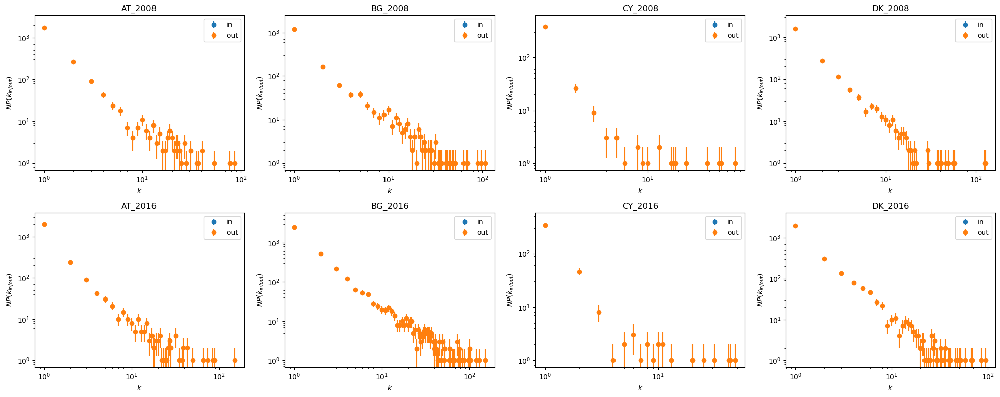

In [8]:
# Determine the layout of the subplots (you may need to adjust these numbers)
cols = 4
rows = int(np.ceil(len(datasets) / float(cols)))

# Create a figure with subplots
fig, axes = plt.subplots(rows, cols, figsize=(cols * 5, rows * 4))
plt.subplots_adjust(wspace=0.4, hspace=0.6)

# Flatten the axes array for easy iteration, in case of a 2D axes array
axes = axes.flatten()

# Loop through each dataset and create plots
for i, (dataset_key, g) in enumerate(datasets.items()):
    ax = axes[i]

    in_hist = gt.vertex_hist(g, "in")
    out_hist = gt.vertex_hist(g, "out")

    y_in = in_hist[0]
    err_in = np.sqrt(in_hist[0])

    y_out = out_hist[0]
    err_out = np.sqrt(out_hist[0])

    ax.errorbar(in_hist[1][:-1], y_in, fmt="o", yerr=err_in, label="in")
    ax.errorbar(out_hist[1][:-1], y_out, fmt="o", yerr=err_out, label="out")

    ax.set_yscale("log")
    ax.set_xscale("log")

    ax.set_xlabel("$k$")
    ax.set_ylabel("$NP(k_{in/out})$")
    ax.set_title(dataset_key)
    ax.legend()

# Hide any unused subplots if the number of plots isn't a perfect grid
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


## Representing the entire network using different layouts

### Representation of the networks in spring / FDP (Scalable Force Directed Placement) layout

In [9]:
# Ensure the output directory exists
output_dir = "fdp_layout"
os.makedirs(output_dir, exist_ok=True)

# Loop through each dataset and save the graph as an image
for dataset_key, g in datasets.items():
    u = gt.extract_largest_component(g, prune=True)
    pos = gt.sfdp_layout(u)
    output_path = os.path.join(output_dir, f"{dataset_key}.png")
    drawing_parameters = draw_weighted_colored_graph(u)
    gt.graph_draw(u, pos, output=output_path, **drawing_parameters)


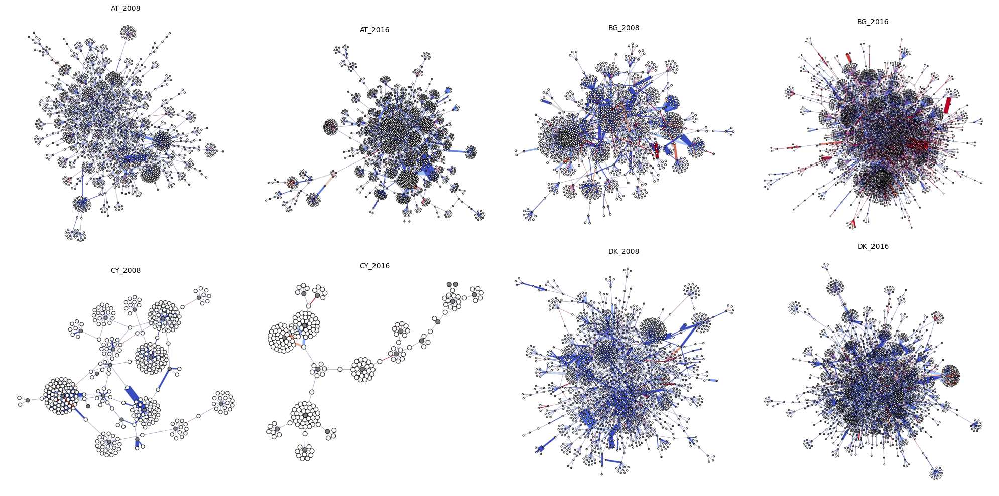

In [12]:
# Get the list of all saved images
image_files = sorted([os.path.join(output_dir, f) for f in os.listdir(output_dir) if f.endswith('.png')])

# Calculate the number of rows and columns for the facet wrap
cols = 4
rows = int(np.ceil(len(image_files) / float(cols)))

# Create the figure with subplots
fig, axes = plt.subplots(rows, cols, figsize=(cols * 5, rows * 5))

# Flatten the axes array for easy iteration, in case of a 2D axes array
axes = axes.flatten()

# Loop through each image file and add it to the subplot
for i, image_file in enumerate(image_files):
    img = mpimg.imread(image_file)
    axes[i].imshow(img)
    axes[i].axis('off')  # Turn off the axis
    # Set the title for the subplot using the filename
    axes[i].set_title(image_file.split('/')[-1].replace('.png', ''), fontsize=10)

# Hide any unused subplots if the number of plots isn't a perfect grid
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

# Adjust layout and display
plt.tight_layout()
plt.show()


### Representation of the networks in Fruchterman Reingold layout

In [ ]:
# Ensure the output directory exists for Fruchterman-Reingold layouts
output_dir_fr = "fruchterman_reingold_layout"
os.makedirs(output_dir_fr, exist_ok=True)

# Loop through each dataset and save the graph with Fruchterman-Reingold layout as an image
for dataset_key, g in datasets.items():
    u = gt.extract_largest_component(g, prune=True)
    pos_fr = gt.fruchterman_reingold_layout(u, n_iter=100)  # Set the number of iterations if needed
    output_path = os.path.join(output_dir_fr, f"{dataset_key}.png")
    drawing_parameters = draw_weighted_colored_graph(u)
    gt.graph_draw(u, pos_fr, output=output_path, **drawing_parameters)


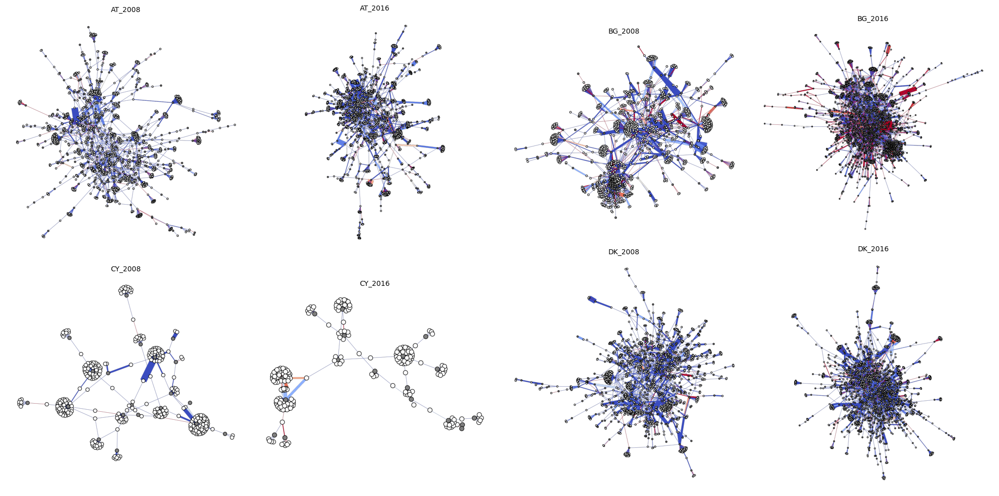

In [34]:
# Get the list of all saved images for Fruchterman-Reingold layouts
image_files_fr = sorted([os.path.join(output_dir_fr, f) for f in os.listdir(output_dir_fr) if f.endswith('.png')])

# Calculate the number of rows and columns for the facet wrap
cols = 4
rows = int(np.ceil(len(image_files_fr) / float(cols)))

# Create the figure with subplots for Fruchterman-Reingold layouts
fig, axes = plt.subplots(rows, cols, figsize=(cols * 5, rows * 5))

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Loop through each image file for Fruchterman-Reingold layouts and add it to the subplot
for i, image_file in enumerate(image_files_fr):
    img = mpimg.imread(image_file)
    axes[i].imshow(img)
    axes[i].axis('off')  # Hide the axes
    # Set the title for the subplot
    axes[i].set_title(image_file.split('/')[-1].replace('.png', ''), fontsize=10)

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

# Adjust the layout and show the visualization
plt.tight_layout()
plt.show()


###  Representation of the networks using pre-determined and stored as a vertex property.

In [35]:
# Ensure the output directory exists for the stored positions
output_dir_vp = "predefined_layout"
os.makedirs(output_dir_vp, exist_ok=True)
# Loop through each dataset and save the graph using the stored positions as an image
for dataset_key, g in datasets.items():
    u = gt.extract_largest_component(g, prune=True)    
    output_path = os.path.join(output_dir_vp, f"{dataset_key}.png")
    drawing_parameters = draw_weighted_colored_graph(u)
    gt.graph_draw(u, pos=u.vp["_pos"], output=output_path,**drawing_parameters)


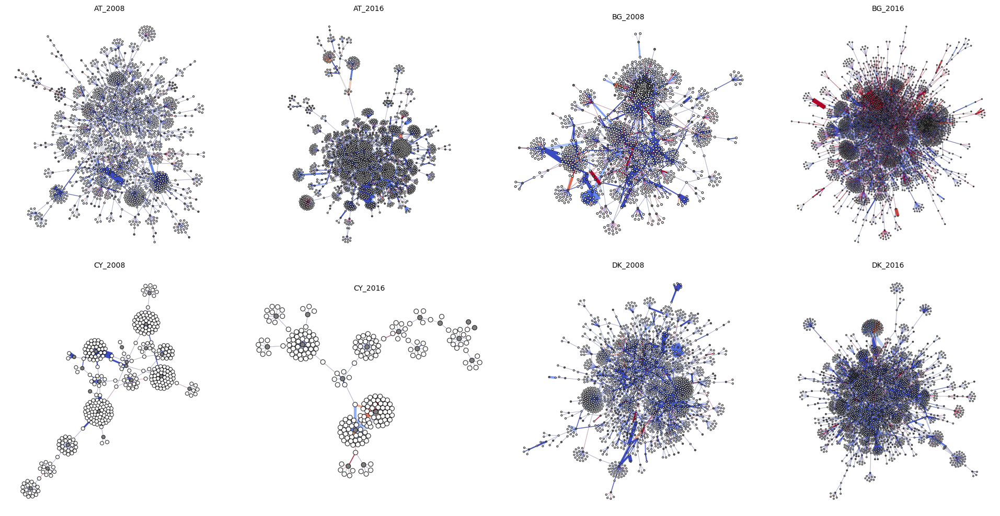

In [36]:
# Get the list of all saved images for the stored positions
image_files_vp = sorted([os.path.join(output_dir_vp, f) for f in os.listdir(output_dir_vp) if f.endswith('.png')])

# Calculate the number of rows and columns for the facet wrap
cols = 4
rows = int(np.ceil(len(image_files_vp) / float(cols)))

# Create the figure with subplots for the stored positions
fig, axes = plt.subplots(rows, cols, figsize=(cols * 5, rows * 5))

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Loop through each image file for the stored positions and add it to the subplot
for i, image_file in enumerate(image_files_vp):
    img = mpimg.imread(image_file)
    axes[i].imshow(img)
    axes[i].axis('off')  # Hide the axes
    # Set the title for the subplot
    axes[i].set_title(image_file.split('/')[-1].replace('.png', ''), fontsize=10)

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

# Adjust the layout and show the visualization
plt.tight_layout()
plt.show()


# Centrality measures for the entire network

### Pake rank centrality

In [ ]:
# Ensure the output directory exists for the PageRank images
output_dir_pr = "pagerank_images"
os.makedirs(output_dir_pr, exist_ok=True)

# Compute and visualize PageRank for each graph, and save as images
for dataset_key, g in datasets.items():
    u = gt.extract_largest_component(g, prune=True)
    
    # Calculate PageRank
    pr = gt.pagerank(u)
    
    # Save the visualization as an image
    output_path = os.path.join(output_dir_pr, f"{dataset_key}.png")
    gt.graph_draw(u, pos=u.vp["_pos"], vertex_fill_color=pr,
                  vertex_size=gt.prop_to_size(pr, mi=5, ma=15),
                  vorder=pr, vcmap=matplotlib.cm.gist_heat,
                  output=output_path)

# Get the list of all saved images for PageRank visualizations
image_files_pr = sorted([os.path.join(output_dir_pr, f) for f in os.listdir(output_dir_pr) if f.endswith('.png')])

# Calculate the number of rows and columns for the facet wrap
cols = 4
rows = int(np.ceil(len(image_files_pr) / float(cols)))

# Create the figure with subplots for the PageRank visualizations
fig, axes = plt.subplots(rows, cols, figsize=(cols * 5, rows * 5))

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Loop through each image file for PageRank visualizations and add it to the subplot
for i, image_file in enumerate(image_files_pr):
    img = mpimg.imread(image_file)
    axes[i].imshow(img)
    axes[i].axis('off')  # Hide the axes
    # Set the title for the subplot
    axes[i].set_title(image_file.split('/')[-1].replace('.png', ''), fontsize=10)

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

# Adjust the layout and show the visualization
plt.tight_layout()
plt.show()


### Betweeness centrality

In [ ]:
# Ensure the output directory exists for the betweenness images
output_dir_bt = "betweenness_images"
os.makedirs(output_dir_bt, exist_ok=True)

# Compute and visualize betweenness for each graph, and save as images
for dataset_key, g in datasets.items():
    u = gt.extract_largest_component(g, prune=True)
    
    # Calculate betweenness
    vp, ep = gt.betweenness(u)
    
    # Save the visualization as an image
    output_path = os.path.join(output_dir_bt, f"{dataset_key}.png")
    gt.graph_draw(u, pos=u.vp["_pos"], vertex_fill_color=vp,
                  vertex_size=gt.prop_to_size(vp, mi=5, ma=15),
                  edge_pen_width=gt.prop_to_size(ep, mi=0.5, ma=5),
                  vcmap=cm.gist_heat, vorder=vp,
                  output=output_path)

# Get the list of all saved images for betweenness visualizations
image_files_bt = sorted([os.path.join(output_dir_bt, f) for f in os.listdir(output_dir_bt) if f.endswith('.png')])

# Calculate the number of rows and columns for the facet wrap
cols = 4
rows = int(np.ceil(len(image_files_bt) / float(cols)))

# Create the figure with subplots for the betweenness visualizations
fig, axes = plt.subplots(rows, cols, figsize=(cols * 5, rows * 5))

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Loop through each image file for betweenness visualizations and add it to the subplot
for i, image_file in enumerate(image_files_bt):
    img = mpimg.imread(image_file)
    axes[i].imshow(img)
    axes[i].axis('off')  # Hide the axes
    # Set the title for the subplot
    axes[i].set_title(image_file.split('/')[-1].replace('.png', ''), fontsize=10)

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

# Adjust the layout and show the visualization
plt.tight_layout()
plt.show()


### Closeness centrality

In [ ]:
# Ensure the output directory exists for the closeness images
output_dir_cl = "closeness_images"
os.makedirs(output_dir_cl, exist_ok=True)

# Compute and visualize closeness for each graph, and save as images
for dataset_key, g in datasets.items():
    u = gt.extract_largest_component(g, prune=True)
    
    # Calculate closeness centrality
    c = gt.closeness(u)
    
    # Save the visualization as an image
    output_path = os.path.join(output_dir_cl, f"{dataset_key}.png")
    gt.graph_draw(u, pos=u.vp["_pos"], vertex_fill_color=c,
                  vertex_size=gt.prop_to_size(c, mi=5, ma=15),
                  vcmap=cm.gist_heat, vorder=c,
                  output=output_path)

# Get the list of all saved images for closeness visualizations
image_files_cl = sorted([os.path.join(output_dir_cl, f) for f in os.listdir(output_dir_cl) if f.endswith('.png')])

# Calculate the number of rows and columns for the facet wrap
cols = 4
rows = int(np.ceil(len(image_files_cl) / float(cols)))

# Create the figure with subplots for the closeness visualizations
fig, axes = plt.subplots(rows, cols, figsize=(cols * 5, rows * 5))

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Loop through each image file for closeness visualizations and add it to the subplot
for i, image_file in enumerate(image_files_cl):
    img = mpimg.imread(image_file)
    axes[i].imshow(img)
    axes[i].axis('off')  # Hide the axes
    # Set the title for the subplot
    axes[i].set_title(image_file.split('/')[-1].replace('.png', ''), fontsize=10)

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

# Adjust the layout and show the visualization
plt.tight_layout()
plt.show()


Note: Decided against running eigenvector centrality because it was too computationally expensive. <br>

### K-core decomposition of the entire network

In [ ]:
# Ensure the output directory exists for the stored images
output_dir_kcore = "kcore_images"
os.makedirs(output_dir_kcore, exist_ok=True)

# Generate k-core decomposition images for each graph
for dataset_key, g in datasets.items():
    u = gt.extract_largest_component(g, prune=True)
    kcore = gt.kcore_decomposition(u)
    output_path = os.path.join(output_dir_kcore, f"{dataset_key}.png")
    gt.graph_draw(u, vertex_fill_color=kcore, vertex_text=kcore, output=output_path)

# Get the list of all saved images for the k-core decompositions
image_files_kcore = sorted([os.path.join(output_dir_kcore, f) for f in os.listdir(output_dir_kcore) if f.endswith('.png')])

# Calculate the number of rows and columns for the facet wrap
cols = 4
rows = int(np.ceil(len(image_files_kcore) / float(cols)))

# Create the figure with subplots for the k-core decompositions
fig, axes = plt.subplots(rows, cols, figsize=(cols * 5, rows * 5))

# Flatten the axes array for easy iteration
axes_flat = axes.flatten()

# Loop through each image file for the k-core decompositions and add it to the subplot
for i, image_file in enumerate(image_files_kcore):
    img = mpimg.imread(image_file)
    axes_flat[i].imshow(img)
    axes_flat[i].axis('off')  # Hide the axes
    # Set the title for the subplot
    axes_flat[i].set_title(image_file.split('/')[-1].replace('.png', ''), fontsize=10)

# Hide any unused subplots
for j in range(i + 1, len(axes_flat)):
    axes_flat[j].axis('off')

# Adjust the layout and show the visualization
plt.tight_layout()
plt.show()


## Measureing centrality/hierarchy in the issuer and winner projection of the network

### Page rank centrality

In [ ]:
# Ensure the output directory exists for the PageRank images
output_dir_pr = "pagerank_images"
os.makedirs(output_dir_pr, exist_ok=True)

# Compute and visualize PageRank for each graph, and save as images
for dataset_key, g in datasets.items():
    u = gt.extract_largest_component(g, prune=True)
    
    # Calculate PageRank
    pr = gt.pagerank(u)
    
    # Save the visualization as an image
    output_path = os.path.join(output_dir_pr, f"{dataset_key}.png")
    gt.graph_draw(u, pos=u.vp["_pos"], vertex_fill_color=pr,
                  vertex_size=gt.prop_to_size(pr, mi=5, ma=15),
                  vorder=pr, vcmap=matplotlib.cm.gist_heat,
                  output=output_path)

# Get the list of all saved images for PageRank visualizations
image_files_pr = sorted([os.path.join(output_dir_pr, f) for f in os.listdir(output_dir_pr) if f.endswith('.png')])

# Calculate the number of rows and columns for the facet wrap
cols = 4
rows = int(np.ceil(len(image_files_pr) / float(cols)))

# Create the figure with subplots for the PageRank visualizations
fig, axes = plt.subplots(rows, cols, figsize=(cols * 5, rows * 5))

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Loop through each image file for PageRank visualizations and add it to the subplot
for i, image_file in enumerate(image_files_pr):
    img = mpimg.imread(image_file)
    axes[i].imshow(img)
    axes[i].axis('off')  # Hide the axes
    # Set the title for the subplot
    axes[i].set_title(image_file.split('/')[-1].replace('.png', ''), fontsize=10)

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

# Adjust the layout and show the visualization
plt.tight_layout()
plt.show()


### Betweness centrality

In [ ]:
# Ensure the output directory exists for the betweenness images
output_dir_bt = "betweenness_images"
os.makedirs(output_dir_bt, exist_ok=True)

# Compute and visualize betweenness for each graph, and save as images
for dataset_key, g in datasets.items():
    u = gt.extract_largest_component(g, prune=True)
    
    # Calculate betweenness
    vp, ep = gt.betweenness(u)
    
    # Save the visualization as an image
    output_path = os.path.join(output_dir_bt, f"{dataset_key}.png")
    gt.graph_draw(u, pos=u.vp["_pos"], vertex_fill_color=vp,
                  vertex_size=gt.prop_to_size(vp, mi=5, ma=15),
                  edge_pen_width=gt.prop_to_size(ep, mi=0.5, ma=5),
                  vcmap=cm.gist_heat, vorder=vp,
                  output=output_path)

# Get the list of all saved images for betweenness visualizations
image_files_bt = sorted([os.path.join(output_dir_bt, f) for f in os.listdir(output_dir_bt) if f.endswith('.png')])

# Calculate the number of rows and columns for the facet wrap
cols = 4
rows = int(np.ceil(len(image_files_bt) / float(cols)))

# Create the figure with subplots for the betweenness visualizations
fig, axes = plt.subplots(rows, cols, figsize=(cols * 5, rows * 5))

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Loop through each image file for betweenness visualizations and add it to the subplot
for i, image_file in enumerate(image_files_bt):
    img = mpimg.imread(image_file)
    axes[i].imshow(img)
    axes[i].axis('off')  # Hide the axes
    # Set the title for the subplot
    axes[i].set_title(image_file.split('/')[-1].replace('.png', ''), fontsize=10)

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

# Adjust the layout and show the visualization
plt.tight_layout()
plt.show()


### Closeness centrality

In [ ]:
# Ensure the output directory exists for the closeness images
output_dir_cl = "closeness_images"
os.makedirs(output_dir_cl, exist_ok=True)

# Compute and visualize closeness for each graph, and save as images
for dataset_key, g in datasets.items():
    u = gt.extract_largest_component(g, prune=True)
    
    # Calculate closeness centrality
    c = gt.closeness(u)
    
    # Save the visualization as an image
    output_path = os.path.join(output_dir_cl, f"{dataset_key}.png")
    gt.graph_draw(u, pos=u.vp["_pos"], vertex_fill_color=c,
                  vertex_size=gt.prop_to_size(c, mi=5, ma=15),
                  vcmap=cm.gist_heat, vorder=c,
                  output=output_path)

# Get the list of all saved images for closeness visualizations
image_files_cl = sorted([os.path.join(output_dir_cl, f) for f in os.listdir(output_dir_cl) if f.endswith('.png')])

# Calculate the number of rows and columns for the facet wrap
cols = 4
rows = int(np.ceil(len(image_files_cl) / float(cols)))

# Create the figure with subplots for the closeness visualizations
fig, axes = plt.subplots(rows, cols, figsize=(cols * 5, rows * 5))

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Loop through each image file for closeness visualizations and add it to the subplot
for i, image_file in enumerate(image_files_cl):
    img = mpimg.imread(image_file)
    axes[i].imshow(img)
    axes[i].axis('off')  # Hide the axes
    # Set the title for the subplot
    axes[i].set_title(image_file.split('/')[-1].replace('.png', ''), fontsize=10)

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

# Adjust the layout and show the visualization
plt.tight_layout()
plt.show()


Note: Decided against running eigenvector centrality because it was too computationally expensive. <br>

### K-core decomposition of the projections

In [ ]:
# Ensure the output directory exists for the stored images
output_dir_kcore = "kcore_images"
os.makedirs(output_dir_kcore, exist_ok=True)

# Generate k-core decomposition images for each graph
for dataset_key, g in datasets.items():
    u = gt.extract_largest_component(g, prune=True)
    kcore = gt.kcore_decomposition(u)
    output_path = os.path.join(output_dir_kcore, f"{dataset_key}.png")
    gt.graph_draw(u, vertex_fill_color=kcore, vertex_text=kcore, output=output_path)

# Get the list of all saved images for the k-core decompositions
image_files_kcore = sorted([os.path.join(output_dir_kcore, f) for f in os.listdir(output_dir_kcore) if f.endswith('.png')])

# Calculate the number of rows and columns for the facet wrap
cols = 4
rows = int(np.ceil(len(image_files_kcore) / float(cols)))

# Create the figure with subplots for the k-core decompositions
fig, axes = plt.subplots(rows, cols, figsize=(cols * 5, rows * 5))

# Flatten the axes array for easy iteration
axes_flat = axes.flatten()

# Loop through each image file for the k-core decompositions and add it to the subplot
for i, image_file in enumerate(image_files_kcore):
    img = mpimg.imread(image_file)
    axes_flat[i].imshow(img)
    axes_flat[i].axis('off')  # Hide the axes
    # Set the title for the subplot
    axes_flat[i].set_title(image_file.split('/')[-1].replace('.png', ''), fontsize=10)

# Hide any unused subplots
for j in range(i + 1, len(axes_flat)):
    axes_flat[j].axis('off')

# Adjust the layout and show the visualization
plt.tight_layout()
plt.show()


### Representation of the hierachy in the issuer and winner projections using Tree layout

In [37]:
# Ensure the output directory exists for the stored positions
output_dir_vp = "tree_layout"
os.makedirs(output_dir_vp, exist_ok=True)

# Assume datasets is a dict with Graph-tool graphs
for dataset_key, g in datasets.items():
    u = gt.extract_largest_component(g, prune=True)    
    pos_tree = gt.radial_tree_layout(u, u.vertex(0))
    output_path = os.path.join(output_dir_vp, f"{dataset_key}.png")
    drawing_parameters = draw_weighted_colored_graph(u)
    gt.graph_draw(u, pos=pos_tree, output=output_path,**drawing_parameters)

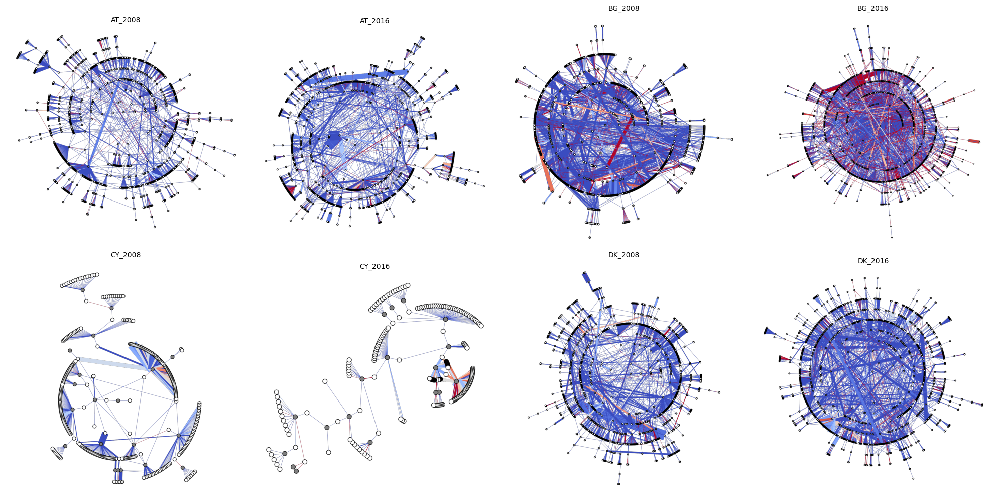

In [38]:
# Get the list of all saved images for the stored positions
image_files_vp = sorted([os.path.join(output_dir_vp, f) for f in os.listdir(output_dir_vp) if f.endswith('.png')])

# Calculate the number of rows and columns for the facet wrap
cols = 4
rows = int(np.ceil(len(image_files_vp) / float(cols)))

# Create the figure with subplots for the stored positions
fig, axes = plt.subplots(rows, cols, figsize=(cols * 5, rows * 5))

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Loop through each image file for the stored positions and add it to the subplot
for i, image_file in enumerate(image_files_vp):
    # Read each graph from its saved file
    img = mpimg.imread(image_file)
    axes[i].imshow(img)
    axes[i].axis('off')  # Hide the axes
    # Set the title for the subplot
    axes[i].set_title(image_file.split('/')[-1].replace('.png', ''), fontsize=10)

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

# Adjust the layout and show the visualization
plt.tight_layout()
plt.show()


### Representation of the projections in alternative tree layout with node with highest out-degree in the centre

In [39]:
# Ensure the output directory exists for the stored positions
output_dir_vp = "output_vp"
os.makedirs(output_dir_vp, exist_ok=True)

# Process each graph to find the vertex with the maximum in-degree
for dataset_key, g in datasets.items():
    u = gt.extract_largest_component(g, prune=True)
    
    # Find the vertex with the maximum in-degree
    out_degrees = u.get_out_degrees(u.get_vertices())
    maximum = max(out_degrees)
    max_in_degree_vertices = np.where(out_degrees == maximum)[0]

    # Print information about the maximum out-degree
    print(f"Graph: {dataset_key}")
    print("Vertices with the maximum in-degree:", max_in_degree_vertices)
    print("Out-degrees of all vertices:", out_degrees)

    # If there are multiple vertices with the maximum in-degree, choose one
    central_vertex = u.vertex(max_in_degree_vertices[0])

    # Compute the radial tree layout from the central vertex
    pos_tree = gt.radial_tree_layout(u, central_vertex)
    
    # Save the graph drawing with radial tree layout
    output_path = os.path.join(output_dir_vp, f"{dataset_key}.png")
    drawing_parameters = draw_weighted_colored_graph(u)
    gt.graph_draw(u, pos=pos_tree, output=output_path,**drawing_parameters)

Graph: AT_2008
Vertices with the maximum in-degree: [296]
Out-degrees of all vertices: [18  1  1 ...  3  1  1]
Graph: BG_2008
Vertices with the maximum in-degree: [164]
Out-degrees of all vertices: [17  3  1 ...  1  1  1]
Graph: CY_2008
Vertices with the maximum in-degree: [185]
Out-degrees of all vertices: [ 2  2  1  9  2  2  1  2  3  1  1  3 17  1  1  1  1  2  1  1  1  1  1  1
  1  1  1  1  1  1 52  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2
  1  1  1  1  1  1  1  1  3  1  1  1  1  1  1  1  1  1  1  1  1  1  2  2
  1  1  1  1  1  1  1  2  1  1  1  8  1  1  1  1  1  1  1  8  1  1  1  1
  1  1  1  3  3  1  1 38  2  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  2  1  1  1  1  1  1  1  1  1  1  1  1  1  1  3 24  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  2  1  1  1  1  1  1  1  4
  2  1  1  4  1  1 10  1  2  1  1  1  1  1  1  1  1 72  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  2  1  1  1  1  1 

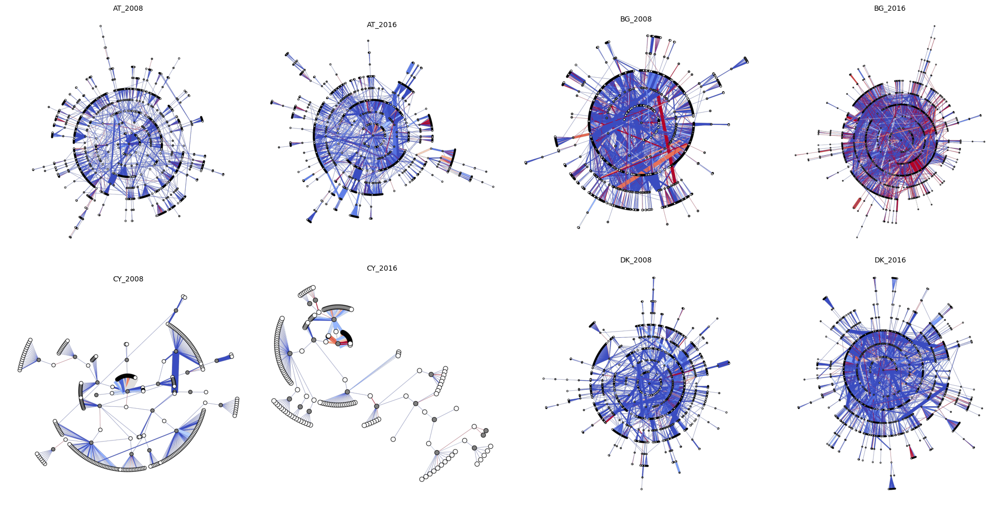

In [40]:
# Get the list of all saved images for the stored positions
image_files_vp = sorted([os.path.join(output_dir_vp, f) for f in os.listdir(output_dir_vp) if f.endswith('.png')])

# Calculate the number of rows and columns for the facet wrap
cols = 4
rows = int(np.ceil(len(image_files_vp) / float(cols)))

# Create the figure with subplots for the stored positions
fig, axes = plt.subplots(rows, cols, figsize=(cols * 5, rows * 5))

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Loop through each image file for the stored positions and add it to the subplot
for i, image_file in enumerate(image_files_vp):
    # Read each graph from its saved file
    img = plt.imread(image_file)
    axes[i].imshow(img)
    axes[i].axis('off')  # Hide the axes
    # Set the title for the subplot
    axes[i].set_title(image_file.split('/')[-1].replace('.png', ''), fontsize=10)

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

# Adjust the layout and show the visualization
plt.tight_layout()
plt.show()


## Shortest paths within the issuer and winner projection of the network

Graph: AT_2008
[ 1  0  2 ...  9 10 10]
Graph: BG_2008
[1 0 2 ... 6 6 6]
Graph: CY_2008
[ 1  0  2  1  2  2  2  2  2  2  2  2  9 10 10 10 10  8 10 10 10 10 10 10
 10 10 10 10 10 10  5  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  4
  6  6  6  6  6  6  6  6  4  6  6  6  6  6  6  6  6  6  6  6  6  6  6  4
  6  6  6  6  6  6  6  6  6  6  6  7  8  8  8  8  8  8  8  3  4  4  4  4
  4  4  4  5  4  6  6  3  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4
  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  5  4  5  6
  6  6  6  6  6  6  6  6  6  6  6  6  6  6  4  6  6  6  6  6  6  6  6  5
  6  6  6  5  6  6  5  6  4  6  6  6  6  6  6  6  6  3  4  4  4  4  4  4
  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4
  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4
  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  5  6  6  6  4  6  6  6  6
  6  3  4  4  4  4  4  4  4  4  4  4  4  4  4  7  8  8  8  8  8  8  8  8
  8  8  8  3  4  4  4  4  4  4  4  4 

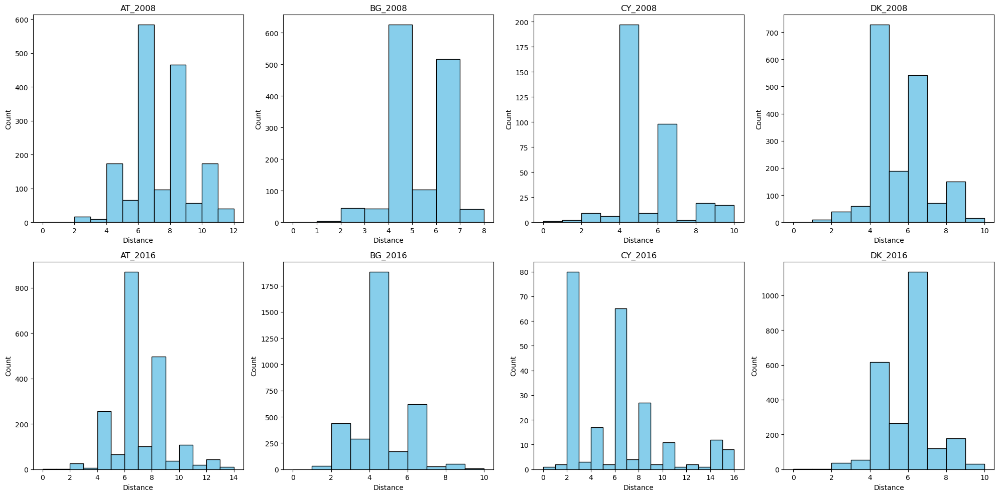

In [44]:
# Assuming datasets is a dictionary with Graph-tool graph objects
output_dir_vp = "output_vp"
os.makedirs(output_dir_vp, exist_ok=True)

# Set the number of columns for your faceted histograms
cols = 4
# Calculate the number of rows we will need
rows = int(np.ceil(len(datasets) / cols))

# Create the figure with subplots
fig, axes = plt.subplots(rows, cols, figsize=(cols * 5, rows * 5))
# Flatten the axes array for easy iteration
axes_flat = axes.flatten()

# Loop through each graph and calculate shortest distances
for i, (dataset_key, g) in enumerate(datasets.items()):
    u = gt.extract_largest_component(g, prune=True)
    
    # Calculate shortest distances from vertex 1
    dist = gt.shortest_distance(u, source=u.vertex(1))
    print(f"Graph: {dataset_key}")
    print(dist.a)  # Print the shortest distances for each vertex
    
    # Plot histogram of distances on the subplot
    ax = axes_flat[i]
    ax.hist(dist.a, bins=range(int(max(dist.a)) + 1), color='skyblue', edgecolor='black')
    ax.set_title(dataset_key)
    ax.set_xlabel('Distance')
    ax.set_ylabel('Count')

# Hide any unused subplots
for j in range(i + 1, len(axes_flat)):
    axes_flat[j].axis('off')

# Adjust the layout and show the visualization
plt.tight_layout()
plt.show()


Graph: AT_2008
[0.00000e+00 3.84200e+03 4.47440e+04 5.12860e+04 3.29372e+05 2.11310e+05
 9.21470e+05 2.77094e+05 6.39506e+05 1.29958e+05 1.71854e+05 2.78240e+04
 2.01400e+04 3.53400e+03 1.88000e+03 2.62000e+02 9.60000e+01]
Graph: BG_2008
[0.00000e+00 4.68800e+03 6.98160e+04 8.22980e+04 5.16870e+05 2.03100e+05
 7.09872e+05 9.74960e+04 1.89960e+05 1.09580e+04 1.88880e+04 6.12000e+02
 1.14400e+03 2.40000e+01 5.40000e+01]
Graph: CY_2008
[    0.   736. 13770.  2808. 24226.  4508. 46454.  3532. 18568.  1166.
  6342.   682.  5640.   168.   640.]
Graph: DK_2008
[0.00000e+00 4.42600e+03 6.62280e+04 8.77420e+04 5.09438e+05 3.96116e+05
 1.04802e+06 3.69340e+05 5.22138e+05 1.05424e+05 1.04100e+05 1.62220e+04
 1.37880e+04 1.30000e+03 1.03600e+03 5.40000e+01 3.00000e+01]
Graph: AT_2016
[0.000000e+00 4.814000e+03 8.325800e+04 8.500200e+04 7.448740e+05
 2.993320e+05 1.394906e+06 2.813100e+05 7.631540e+05 1.339120e+05
 2.429560e+05 5.244400e+04 6.520800e+04 1.373600e+04 8.680000e+03
 1.550000e+03 6.640

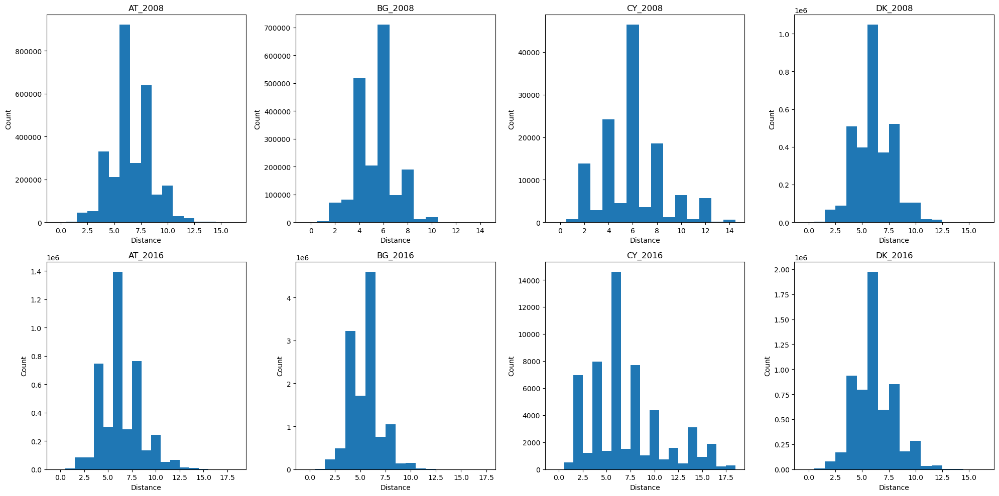

In [45]:
import os
import numpy as np
import matplotlib.pyplot as plt
import graph_tool.all as gt

# Assuming 'datasets' is a dictionary with graph_tool graph objects
output_dir_vp = "output_vp"
os.makedirs(output_dir_vp, exist_ok=True)

# Determine the number of rows and columns for the facet grid
cols = 4
rows = int(np.ceil(len(datasets) / cols))

# Create the figure with subplots
fig, axes = plt.subplots(rows, cols, figsize=(cols * 5, rows * 5))

# Flatten the axes array for easy iteration
axes_flat = axes.flatten()

# Process each graph to calculate and plot the distance histogram
for i, (dataset_key, g) in enumerate(datasets.items()):
    u = gt.extract_largest_component(g, prune=True)
    
    # Calculate distance histogram using graph_tool
    hist, bin_edges = gt.distance_histogram(u)
    print(f"Graph: {dataset_key}")
    print(hist)  # Print the histogram for each graph
    
    # Plot the histogram of distances on the subplot
    ax = axes_flat[i]
    ax.bar(bin_edges[:-1], hist, width=1)
    ax.set_title(dataset_key)
    ax.set_xlabel('Distance')
    ax.set_ylabel('Count')

# Hide any unused subplots
for j in range(i + 1, len(axes_flat)):
    axes_flat[j].axis('off')

# Adjust the layout and show the visualization
plt.tight_layout()
plt.show()


### Average path length

In [46]:
# Assuming 'datasets' is a dictionary with graph_tool graph objects
# Loop through each graph and calculate the average shortest path length
for dataset_key, g in datasets.items():
    u = gt.extract_largest_component(g, prune=True)
    
    # Calculate shortest distances for all pairs
    dist = gt.shortest_distance(u)
    
    # Calculate and print the average path length
    average_path_length = gt.vertex_average(u, dist)
    print(f"Graph: {dataset_key}, Average path length: {np.mean(average_path_length)}")


Graph: AT_2008, Average path length: 3.320270693615452
Graph: BG_2008, Average path length: 2.704077615560222
Graph: CY_2008, Average path length: 3.023120307258224
Graph: DK_2008, Average path length: 3.0719659373696224
Graph: AT_2016, Average path length: 3.2112424080908455
Graph: BG_2016, Average path length: 2.745128053416263
Graph: CY_2016, Average path length: 3.6261328359183063
Graph: DK_2016, Average path length: 3.092627544412773


### Pseudo-diameter

In [ ]:
# Initialize a dictionary to store the pseudo diameters
pseudo_diameters = {}

# Calculate the pseudo diameter for each graph and store the information
for dataset_key, g in datasets.items():
    u = gt.extract_largest_component(g, prune=True)
    
    # Get the pseudo diameter and the end vertices of the path
    pseudo_diam, end_points = gt.pseudo_diameter(u)
    
    # Find the shortest path between the end_points, which represents the pseudo diameter
    path = gt.shortest_path(u, source=end_points[0], target=end_points[1])[0]
    
    # Store the results
    pseudo_diameters[dataset_key] = {
        'pseudo_diameter': pseudo_diam,
        'path_length': len(path),
        'end_points': (int(end_points[0]), int(end_points[1]))
    }

# Display the results in a neatly formatted table
header = f"{'Graph':<20}{'Pseudo Diameter':<20}{'Path Length':<15}{'End Points':<30}"
print(header)
print("-" * len(header))  # Print a separator line

for key, value in pseudo_diameters.items():
    end_points_str = f"({value['end_points'][0]}, {value['end_points'][1]})"
    print(f"{key:<20}{value['pseudo_diameter']:<20}{value['path_length']:<15}{end_points_str:<30}")

## Percolation thresholds of the issuer and winner projections of the network

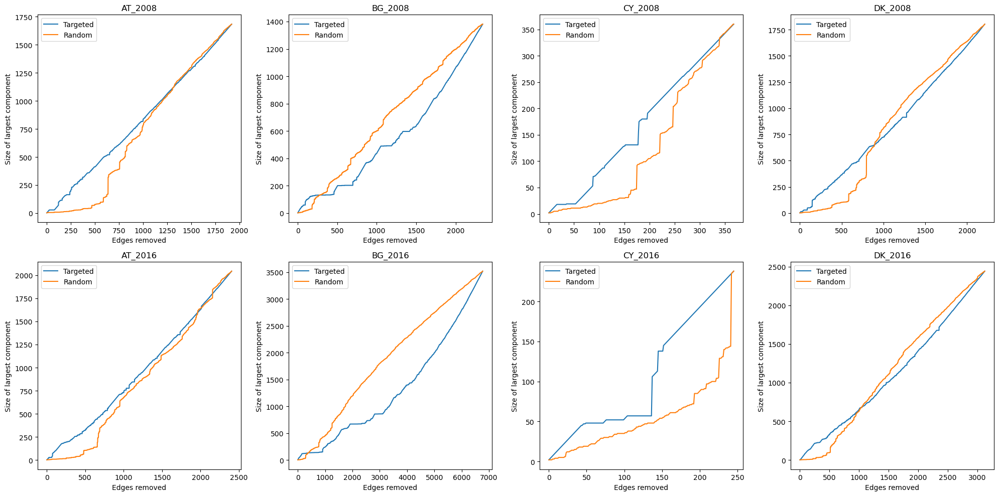

In [47]:
# Assuming 'datasets' is a dictionary with graph_tool graph objects
# Determine the number of rows and columns for the facet grid
cols = 4
rows = int(np.ceil(len(datasets) / cols))

# Create the figure with subplots
fig, axes = plt.subplots(rows, cols, figsize=(cols * 5, rows * 5))

# Flatten the axes array for easy iteration
axes_flat = axes.flatten()

# Process each graph to calculate and plot the edge percolation
for i, (dataset_key, g) in enumerate(datasets.items()):
    u = gt.extract_largest_component(g, prune=True)

    # Calculate edges sorted by the product of their vertex degrees for targeted percolation
    edges = sorted([(e.source(), e.target()) for e in u.edges()],
                   key=lambda e: e[0].in_degree() * e[1].in_degree(), reverse=True)

    # Perform targeted edge percolation
    sizes, comp = gt.edge_percolation(u, edges)

    # Shuffle edges for random percolation
    np.random.shuffle(edges)
    sizes2, comp2 = gt.edge_percolation(u, edges)

    # Plot the results on the subplot
    ax = axes_flat[i]
    ax.plot(sizes, label="Targeted")
    ax.plot(sizes2, label="Random")
    ax.set_title(dataset_key)
    ax.set_xlabel('Edges removed')
    ax.set_ylabel('Size of largest component')
    ax.legend()

# Hide any unused subplots
for j in range(i + 1, len(axes_flat)):
    axes_flat[j].axis('off')

# Adjust the layout and show the visualization
plt.tight_layout()
plt.show()


## Clustering within the issuer and winner projections


Note on clustering coefficient: 
The dataset you mentioned seems to describe a bipartite graph (nodes are either issuers "_i" or winners "_w", and edges exist only between issuers and winners). In a bipartite graph, there are no edges between nodes of the same set, and thus, by definition, the local clustering coefficient for every node is zero because there cannot be any triangles (which the clustering coefficient measures).
Given that the networks represent public procurement markets and are likely bipartite, the zero clustering coefficient might indeed be correct. For bipartite graphs, you might want to look at other metrics that are more informative for such structures, like bipartite density, matching index, or others that take into account the bipartite nature of the network.

If you are trying to calculate a clustering coefficient for a bipartite graph using tools or algorithms designed for general graphs, you should instead use metrics designed for bipartite graphs. There are definitions and algorithms for clustering coefficients in bipartite graphs that differ from those in general graphs, which could give you more meaningful insights for your data.

Detecting clusters and visualising them using the blockmodel

Clustering coefficient

In [ ]:
clust = gt.local_clustering(u)

print(gt.vertex_average(u, clust))

In [ ]:
print(clust.a)


In [ ]:
out_degs = u.get_out_degrees(u.get_vertices())

In [ ]:
plt.scatter(out_degs, clust.a, alpha=0.5)

In [ ]:
in_degs = u.get_in_degrees(u.get_vertices())

In [ ]:
plt.scatter(in_degs, clust.a, alpha=0.5)

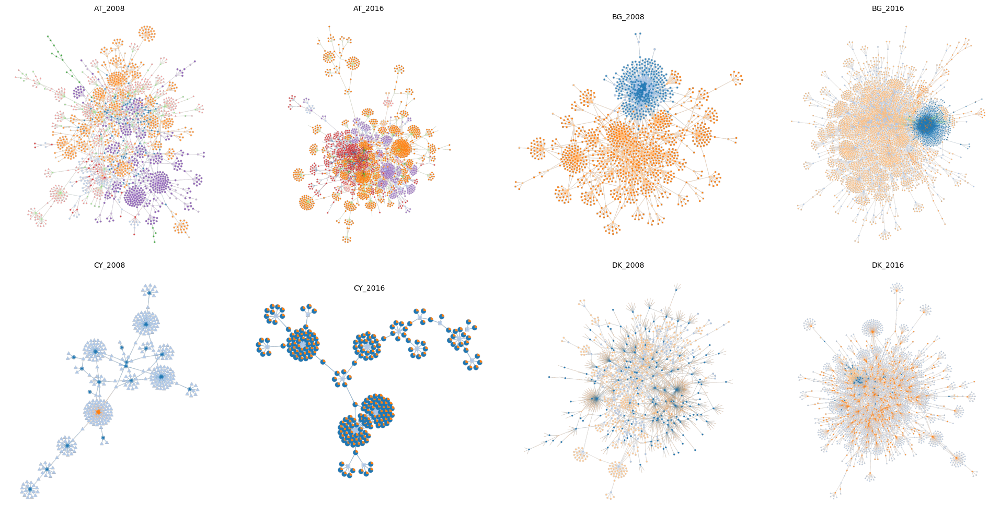

In [4]:
# Ensure the output directory exists for the blockmodel images
output_dir_bm = "blockmodel_images"
os.makedirs(output_dir_bm, exist_ok=True)

# Compute and visualize the blockmodel for each graph, and save as images
for dataset_key, g in datasets.items():
    # Extract the largest component
    u = gt.extract_largest_component(g, prune=True)
    
    # Minimize the blockmodel description length
    state = gt.minimize_blockmodel_dl(u)
    
    # Save the visualization as an image
    output_path = os.path.join(output_dir_bm, f"{dataset_key}.png")
    state.draw(pos=u.vp["_pos"], vertex_shape=state.get_blocks(), output=output_path)

# Get the list of all saved images for blockmodel visualizations
image_files_bm = sorted([os.path.join(output_dir_bm, f) for f in os.listdir(output_dir_bm) if f.endswith('.png')])

# Calculate the number of rows and columns for the facet wrap
cols = 4
rows = int(np.ceil(len(image_files_bm) / float(cols)))

# Create the figure with subplots for the blockmodel visualizations
fig, axes = plt.subplots(rows, cols, figsize=(cols * 5, rows * 5))

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Loop through each image file for blockmodel visualizations and add it to the subplot
for i, image_file in enumerate(image_files_bm):
    img = mpimg.imread(image_file)
    axes[i].imshow(img)
    axes[i].axis('off')  # Hide the axes
    # Set the title for the subplot
    axes[i].set_title(image_file.split('/')[-1].replace('.png', ''), fontsize=10)

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

# Adjust the layout and show the visualization
plt.tight_layout()
plt.show()


Fruchtermann-Reingold version

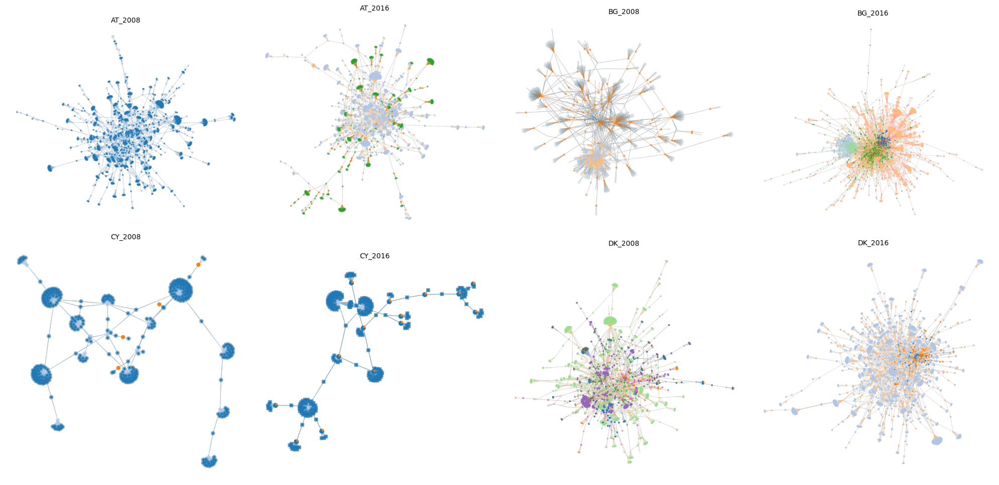

In [5]:
# Ensure the output directory exists for the blockmodel images
output_dir_bm = "blockmodel_fr_images"
os.makedirs(output_dir_bm, exist_ok=True)

# Compute and visualize the blockmodel for each graph, and save as images
for dataset_key, g in datasets.items():
    # Extract the largest component
    u = gt.extract_largest_component(g, prune=True)
    
    # Compute the Fruchterman-Reingold layout for u
    pos_fr = gt.fruchterman_reingold_layout(u, n_iter=100)  # You can adjust the iterations if needed
    
    # Minimize the blockmodel description length
    state = gt.minimize_blockmodel_dl(u)
    
    # Save the visualization as an image
    output_path = os.path.join(output_dir_bm, f"{dataset_key}.png")
    state.draw(pos=pos_fr, vertex_shape=state.get_blocks(), output=output_path)

# Get the list of all saved images for blockmodel visualizations
image_files_bm = sorted([os.path.join(output_dir_bm, f) for f in os.listdir(output_dir_bm) if f.endswith('.png')])

# Calculate the number of rows and columns for the facet wrap
cols = 4
rows = int(np.ceil(len(image_files_bm) / float(cols)))

# Create the figure with subplots for the blockmodel visualizations
fig, axes = plt.subplots(rows, cols, figsize=(cols * 5, rows * 5))

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Loop through each image file for blockmodel visualizations and add it to the subplot
for i, image_file in enumerate(image_files_bm):
    img = mpimg.imread(image_file)
    axes[i].imshow(img)
    axes[i].axis('off')  # Hide the axes
    # Set the title for the subplot
    axes[i].set_title(image_file.split('/')[-1].replace('.png', ''), fontsize=10)

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

# Adjust the layout and show the visualization
plt.tight_layout()
plt.show()


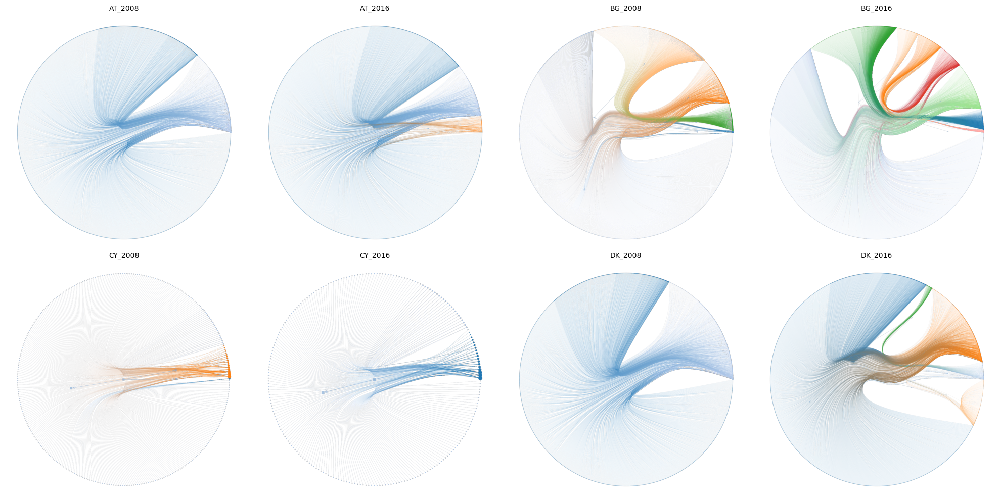

In [7]:
# Ensure the output directory exists for the nested blockmodel images
output_dir_nbm = "nested_blockmodel_images"
os.makedirs(output_dir_nbm, exist_ok=True)

# Compute and visualize the nested blockmodel for each graph, and save as images
for dataset_key, g in datasets.items():
    # Extract the largest component
    u = gt.extract_largest_component(g, prune=True)
    
    # Compute the nested blockmodel
    state2 = gt.minimize_nested_blockmodel_dl(u)
    
    # Save the visualization as an image
    output_path = os.path.join(output_dir_nbm, f"{dataset_key}.png")
    state2.draw(output=output_path)  # Draw and save the visualization

# Get the list of all saved images for nested blockmodel visualizations
image_files_nbm = sorted([os.path.join(output_dir_nbm, f) for f in os.listdir(output_dir_nbm) if f.endswith('.png')])

# Calculate the number of rows and columns for the facet wrap
cols = 4
rows = int(np.ceil(len(image_files_nbm) / float(cols)))

# Create the figure with subplots for the nested blockmodel visualizations
fig, axes = plt.subplots(rows, cols, figsize=(cols * 5, rows * 5))

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Loop through each image file for nested blockmodel visualizations and add it to the subplot
for i, image_file in enumerate(image_files_nbm):
    img = mpimg.imread(image_file)
    axes[i].imshow(img)
    axes[i].axis('off')  # Hide the axes
    # Set the title for the subplot
    axes[i].set_title(image_file.split('/')[-1].replace('.png', ''), fontsize=10)

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

# Adjust the layout and show the visualization
plt.tight_layout()
plt.show()


Another kind of blockmodel? or is it a repetition

In [ ]:
# Ensure the output directory exists for the stored positions
output_dir_vp = "output_vp"
os.makedirs(output_dir_vp, exist_ok=True)

# Process each graph to create a nested blockmodel and visualize it
for dataset_key, g in datasets.items():
    u = gt.extract_largest_component(g, prune=True)
    
    # Minimize the nested blockmodel
    state = gt.minimize_nested_blockmodel_dl(u)
    
    # Get the hierarchy tree and compute the layout
    t = gt.get_hierarchy_tree(state)[0]
    tpos = gt.radial_tree_layout(t, t.vertex(t.num_vertices() - 1, use_index=False), weighted=True)
    cts = gt.get_hierarchy_control_points(u, t, tpos)
    pos = u.own_property(tpos)
    
    # Get the block labels for coloring the vertices
    b = state.levels[0].b
    
    # Copy the block labels and take modulo for shaping
    shape = b.copy()
    shape.a %= 14  # This will result in 14 different shapes
    
    # Draw the graph with the computed layout and save it
    output_path = os.path.join(output_dir_vp, f"{dataset_key}.png")
    gt.graph_draw(u, pos=pos, vertex_fill_color=b, vertex_shape=shape,
                  edge_control_points=cts, edge_color=[0, 0, 0, 0.3], 
                  vertex_anchor=0, output=output_path)

In [ ]:


# Get the list of all saved images for the stored positions
image_files_vp = sorted([os.path.join(output_dir_vp, f) for f in os.listdir(output_dir_vp) if f.endswith('.png')])

# Calculate the number of rows and columns for the facet wrap
cols = 4
rows = int(np.ceil(len(image_files_vp) / float(cols)))

# Create the figure with subplots for the stored positions
fig, axes = plt.subplots(rows, cols, figsize=(cols * 5, rows * 5))

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Loop through each image file for the stored positions and add it to the subplot
for i, image_file in enumerate(image_files_vp):
    # Read each graph from its saved file
    img = plt.imread(image_file)
    axes[i].imshow(img)
    axes[i].axis('off')  # Hide the axes
    # Set the title for the subplot
    axes[i].set_title(image_file.split('/')[-1].replace('.png', ''), fontsize=10)

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

# Adjust the layout and show the visualization
plt.tight_layout()
plt.show()
